# Семантическая сегментация изображений городских сцен с воздуха

Dataset Resource: https://www.tugraz.at/index.php?id=22387

https://www.kaggle.com/datasets/bulentsiyah/semantic-drone-dataset?resource=download


Для решения задачи семантической сегментации изображений используем набор данных Semantic Drone Dataset, который фокусируется на семантическом понимании городских сцен для повышения безопасности автономных полетов дронов и процедур посадки. На снимках изображено более 20 домов в надире (с высоты птичьего полета), полученном на высоте от 5 до 30 метров над землей. Для получения изображений размером 6000x4000 пикселей (24 мегапикселя) использовалась камера высокого разрешения. Учебный набор содержит 400 общедоступных изображений.


In [ ]:
import shutil
import os
import zipfile

import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.metrics import MeanIoU

In [ ]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

zip_file = '/content/drive/MyDrive/машинное зрение/archive.zip'
z = zipfile.ZipFile(zip_file, 'r')
z.extractall()
print(os.listdir())




Mounted at /content/drive/
['.config', 'dataset', 'class_dict_seg.csv', 'drive', 'RGB_color_image_masks', 'sample_data']


In [ ]:


labels = pd.read_csv('class_dict_seg.csv')
labels.head()



,name,r,g,b
0,unlabeled,0,0,0
1,paved-area,128,64,128
2,dirt,130,76,0
3,grass,0,102,0
4,gravel,112,103,87


In [ ]:
def load_data(image_path, mask_path, image_size=(256, 256)):
  images = []
  masks = []

  for img_name in os.listdir(image_path):
    img = Image.open(os.path.join(image_path, img_name))
    img = img.resize(image_size)
    img = np.array(img)

    mask_name = img_name.replace('.jpg', '.png')
    mask = Image.open(os.path.join(mask_path, mask_name))
    mask = mask.resize(image_size)
    mask = np.array(mask)

    images.append(img)
    masks.append(mask)

  return np.array(images), np.array(masks)




In [ ]:
image_path = 'dataset/semantic_drone_dataset/original_images'
mask_path = 'dataset/semantic_drone_dataset/label_images_semantic'

image_size = (256, 256)
images, masks = load_data(image_path, mask_path, image_size)

num_classes = labels.shape[0]
masks = np.where(masks >= num_classes, 0, masks)

Разобьем выборку на тренировочную и валидационную в пропорции 4:1

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(images, masks, test_size=0.2, random_state=12345)

y_train_cat = np.zeros((y_train.shape[0], y_train.shape[1], y_train.shape[2], num_classes), dtype=np.uint8)
y_val_cat = np.zeros((y_val.shape[0], y_val.shape[1], y_val.shape[2], num_classes), dtype=np.uint8)

for i in range(y_train.shape[0]):
    y_train_cat[i] = to_categorical(y_train[i], num_classes=num_classes)

for i in range(y_val.shape[0]):
    y_val_cat[i] = to_categorical(y_val[i], num_classes=num_classes)

print(f"y_train_cat shape: {y_train_cat.shape}") #количесво изображений, формат, количество батчей
print(f"y_val_cat shape: {y_val_cat.shape}")

y_train_cat shape: (320, 256, 256, 24)
y_val_cat shape: (80, 256, 256, 24)


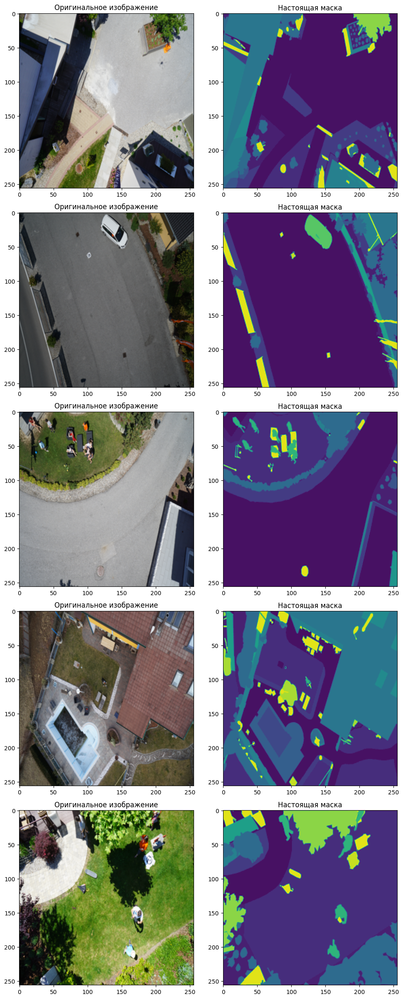

In [ ]:
def display_images(images, masks, num_examples=5):
  fig, axes = plt.subplots(num_examples, 2, figsize=(10, num_examples * 5))
  for i in range(num_examples):
    axes[i, 0].imshow(images[i])
    axes[i, 0].set_title('Оригинальное изображение')
    axes[i, 1].imshow(np.argmax(masks[i], axis=-1))
    axes[i, 1].set_title('Настоящая маска')


  plt.tight_layout()
  plt.subplots_adjust(top=0.95)
  plt.show()


display_images(X_val, y_val_cat)

Построим модель U-Net

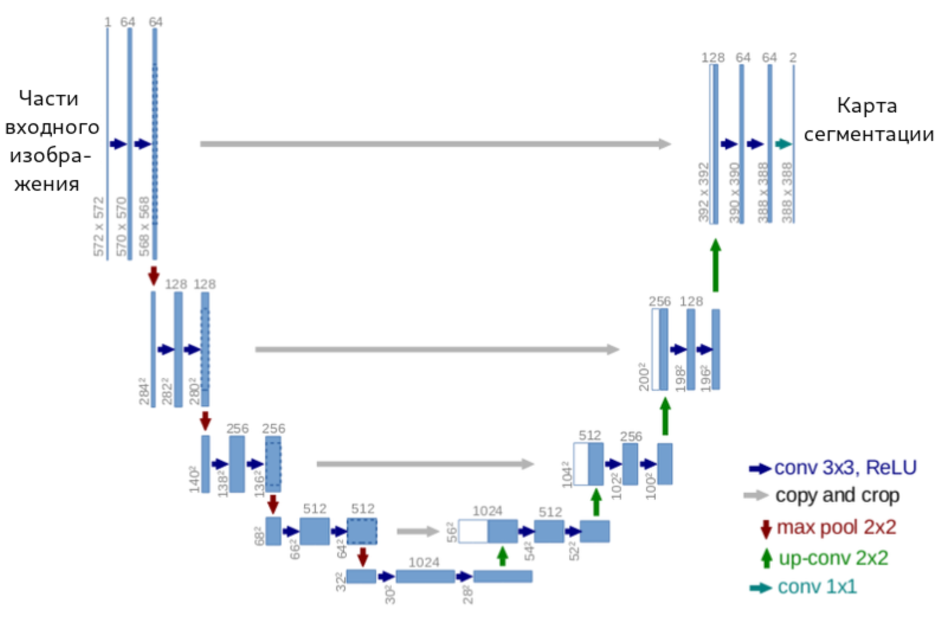

In [ ]:
def unet_model(input_size=(256, 256, 3), num_classes=23):
    inputs = tf.keras.layers.Input(input_size)

    c1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    c1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

    c2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p1)
    c2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

    c3 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p2)
    c3 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c3)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

    c4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p3)
    c4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    p4 = tf.keras.layers.MaxPooling2D((2, 2))(c4)

    c5 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p4)
    c5 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c5)

    u6 = tf.keras.layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])
    c6 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u6)
    c6 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c6)

    u7 = tf.keras.layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c3])
    c7 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u7)
    c7 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c7)

    u8 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    c8 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u8)
    c8 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c8)

    u9 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1])
    c9 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u9)
    c9 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c9)

    outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='softmax')(c9)

    model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
    return model

model = unet_model(input_size=(256, 256, 3), num_classes=num_classes)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[MeanIoU(num_classes=num_classes)])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 256, 256, 64)   │          1,792 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ conv2d_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 128, 128, 64)   │              0 │ conv2d_6[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ conv2d_7[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5           │ (None, 64, 64, 128)    │              0 │ conv2d_8[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_10 (Conv2D)        │ (None, 64, 64, 256)    │        590,080 │ conv2d_9[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 32, 32, 256)    │              0 │ conv2d_10[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_11 (Conv2D)        │ (None, 32, 32, 512)    │      1,180,160 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_12 (Conv2D)        │ (None, 32, 32, 512)    │      2,359,808 │ conv2d_11[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_7           │ (None, 16, 16, 512)    │              0 │ conv2d_12[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_13 (Conv2D)        │ (None, 16, 16, 1024)   │      4,719,616 │ max_pooling2d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_14 (Conv2D)        │ (None, 16, 16, 1024)   │      9,438,208 │ conv2d_13[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_4        │ (None, 32, 32, 512)    │      2,097,664 │ conv2d_14[0][0]        │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concaten

 Total params: 31,033,240 (118.38 MB)

 Trainable params: 31,033,240 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
data_gen_args = dict(rotation_range=90,
                     #width_shift_range=0.1,
                     #height_shift_range=0.1,
                     shear_range=0.01,
                     zoom_range=0.3, #аугментация
                     horizontal_flip=True,
                     vertical_flip=True,
                     fill_mode='reflect')

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

image_generator = image_datagen.flow(X_train, batch_size=16, seed=12345)
mask_generator = mask_datagen.flow(y_train_cat, batch_size=16, seed=12345)

img_batch, mask_batch = next(image_generator), next(mask_generator)
print(f"Batch image shape: {img_batch.shape}")
print(f"Batch mask shape: {mask_batch.shape}")

def combined_generator(image_gen, mask_gen):
    while True:
        X = next(image_gen)
        Y = next(mask_gen)
        yield X, Y

train_generator = combined_generator(image_generator, mask_generator)

/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:619: UserWarning: NumpyArrayIterator is set to use the data format convention "channels_last" (channels on axis 3), i.e. expected either 1, 3, or 4 channels on axis 3. However, it was passed an array with shape (320, 256, 256, 24) (24 channels).
  warnings.warn(


Batch image shape: (16, 256, 256, 3)
Batch mask shape: (16, 256, 256, 24)


In [ ]:
unet_history = model.fit(train_generator,
                    validation_data=(X_val, y_val_cat),
                    steps_per_epoch=len(X_train) // 16,
                    epochs=5)

Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 170s 5s/step - loss: 6.7485 - mean_io_u_1: 0.3298 - val_loss: 2.0441 - val_mean_io_u_1: 0.3810
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 52s 3s/step - loss: 1.9929 - mean_io_u_1: 0.3290 - val_loss: 1.8899 - val_mean_io_u_1: 0.3810
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 53s 3s/step - loss: 1.7743 - mean_io_u_1: 0.3283 - val_loss: 1.8533 - val_mean_io_u_1: 0.3810
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 52s 3s/step - loss: 1.7828 - mean_io_u_1: 0.3292 - val_loss: 1.7633 - val_mean_io_u_1: 0.3810
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 53s 3s/step - loss: 1.7998 - mean_io_u_1: 0.3292 - val_loss: 1.7693 - val_mean_io_u_1: 0.3810


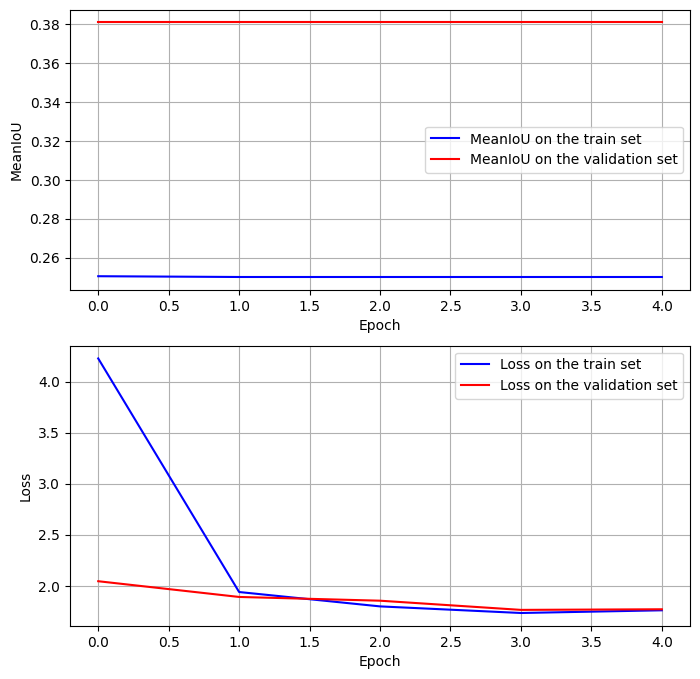

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(unet_history.history['mean_io_u_1'], label='MeanIoU on the train set', color = 'b')
plt.plot(unet_history.history['val_mean_io_u_1'], label='MeanIoU on the validation set', color = 'r')
plt.xlabel('Epoch')
plt.ylabel('MeanIoU')
plt.legend()
plt.grid(True)

plt.subplot(2, 1, 2)
plt.plot(unet_history.history['loss'], label='Loss on the train set', color = 'b')
plt.plot(unet_history.history['val_loss'], label='Loss on the validation set', color = 'r')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Построим модель SegNet

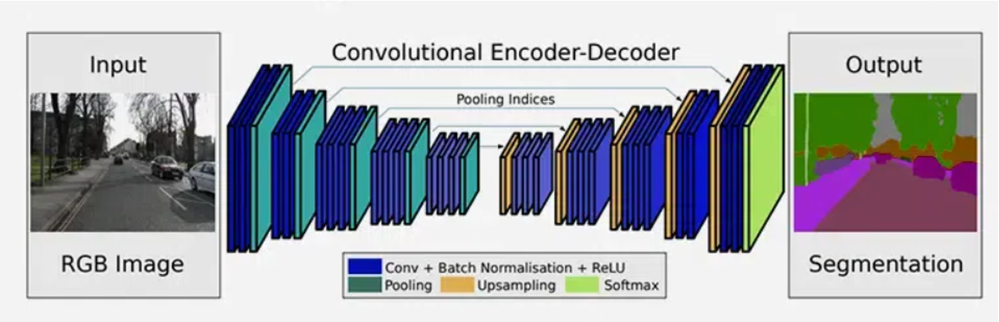

In [ ]:
def segnet_model(input_size=(256, 256, 3), num_classes=23):
    inputs = tf.keras.Input(shape=input_size)

    encoder = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(inputs)
    encoder = tf.keras.layers.BatchNormalization()(encoder)
    encoder = tf.keras.layers.MaxPooling2D((2, 2))(encoder)

    encoder = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(encoder)
    encoder = tf.keras.layers.BatchNormalization()(encoder)
    encoder = tf.keras.layers.MaxPooling2D((2, 2))(encoder)

    encoder = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu')(encoder)
    encoder = tf.keras.layers.BatchNormalization()(encoder)
    encoder = tf.keras.layers.MaxPooling2D((2, 2))(encoder) #можно добавить до 512 или 1024 фильтров

    encoder = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(encoder)
    encoder = tf.keras.layers.BatchNormalization()(encoder)
    encoder = tf.keras.layers.MaxPooling2D((2, 2))(encoder)

    encoder = tf.keras.layers.Conv2D(1024, (3, 3), padding='same', activation='relu')(encoder)
    encoder = tf.keras.layers.BatchNormalization()(encoder)
    encoder = tf.keras.layers.MaxPooling2D((2, 2))(encoder)

    decoder = tf.keras.layers.Conv2DTranspose(1024, (3, 3), strides=(2, 2), padding='same', activation='relu')(encoder)
    decoder = tf.keras.layers.BatchNormalization()(decoder)

    decoder = tf.keras.layers.Conv2DTranspose(512, (3, 3), strides=(2, 2), padding='same', activation='relu')(decoder)
    decoder = tf.keras.layers.BatchNormalization()(decoder)

    decoder = tf.keras.layers.Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same', activation='relu')(decoder)
    decoder = tf.keras.layers.BatchNormalization()(decoder)

    decoder = tf.keras.layers.Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', activation='relu')(decoder)
    decoder = tf.keras.layers.BatchNormalization()(decoder)

    decoder = tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', activation='relu')(decoder)
    decoder = tf.keras.layers.BatchNormalization()(decoder)

    outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='softmax')(decoder)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

segnet = segnet_model(input_size=(256, 256, 3), num_classes=num_classes)
segnet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[MeanIoU(num_classes=num_classes)])
segnet.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)          │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_227 (Conv2D)                  │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_61               │ (None, 256, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_51 (MaxPooling2D)      │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_228 (Conv2D)                  │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_62               │ (None, 128, 128, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_52 (MaxPooling2D)      │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_229 (Conv2D)                  │ (None, 64, 64, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_63               │ (None, 64, 64, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_53 (MaxPooling2D)      │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_230 (Conv2D)                  │ (None, 32, 32, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_64               │ (None, 32, 32, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_54 (MaxPooling2D)      │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_37                  │ (None, 32, 32, 512)         │       2,359,808 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_65               │ (None, 32, 32, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_38                  │ (None, 64, 64, 256)         │       1,179,904 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_66               │ (None, 64, 64, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 5,468,760 (20.86 MB)

 Trainable params: 5,464,920 (20.85 MB)

 Non-trainable params: 3,840 (15.00 KB)

In [ ]:
segnet_history = segnet.fit(train_generator,
                    validation_data=(X_val, y_val_cat),
                    steps_per_epoch=len(X_train) // 16,
                    epochs=5)

Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - loss: 3.1212 - mean_io_u_11: 0.3292 - val_loss: 24.0125 - val_mean_io_u_11: 0.3817
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - loss: 1.8254 - mean_io_u_11: 0.3285 - val_loss: 6.0507 - val_mean_io_u_11: 0.3810
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 50s 3s/step - loss: 1.7249 - mean_io_u_11: 0.3288 - val_loss: 7.2112 - val_mean_io_u_11: 0.3810
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 50s 3s/step - loss: 1.5983 - mean_io_u_11: 0.3290 - val_loss: 5.3010 - val_mean_io_u_11: 0.3810
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step - loss: 1.5748 - mean_io_u_11: 0.3283 - val_loss: 4.2661 - val_mean_io_u_11: 0.3810


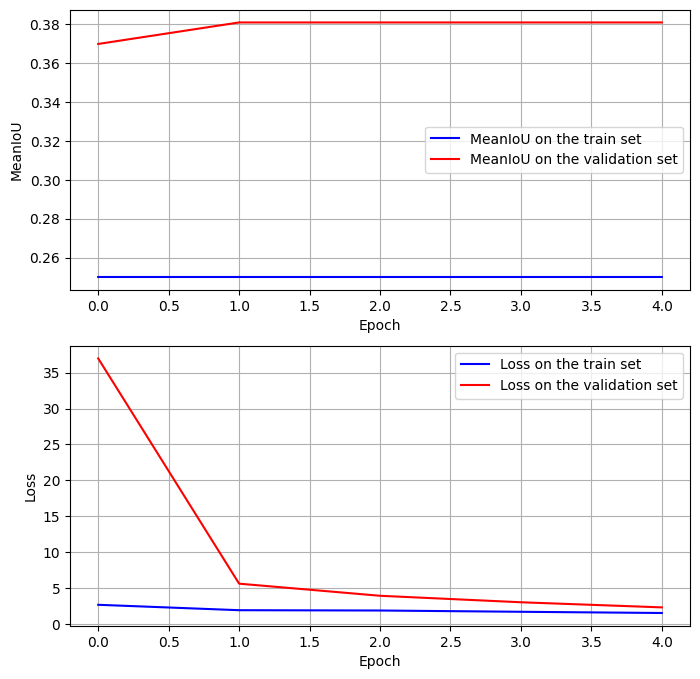

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(segnet_history.history['mean_io_u'], label='MeanIoU on the train set', color = 'b')
plt.plot(segnet_history.history['val_mean_io_u'], label='MeanIoU on the validation set', color = 'r')
plt.xlabel('Epoch')
plt.ylabel('MeanIoU')
plt.legend()
plt.grid(True)

plt.subplot(2, 1, 2)
plt.plot(segnet_history.history['loss'], label='Loss on the train set', color = 'b')
plt.plot(segnet_history.history['val_loss'], label='Loss on the validation set', color = 'r')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step


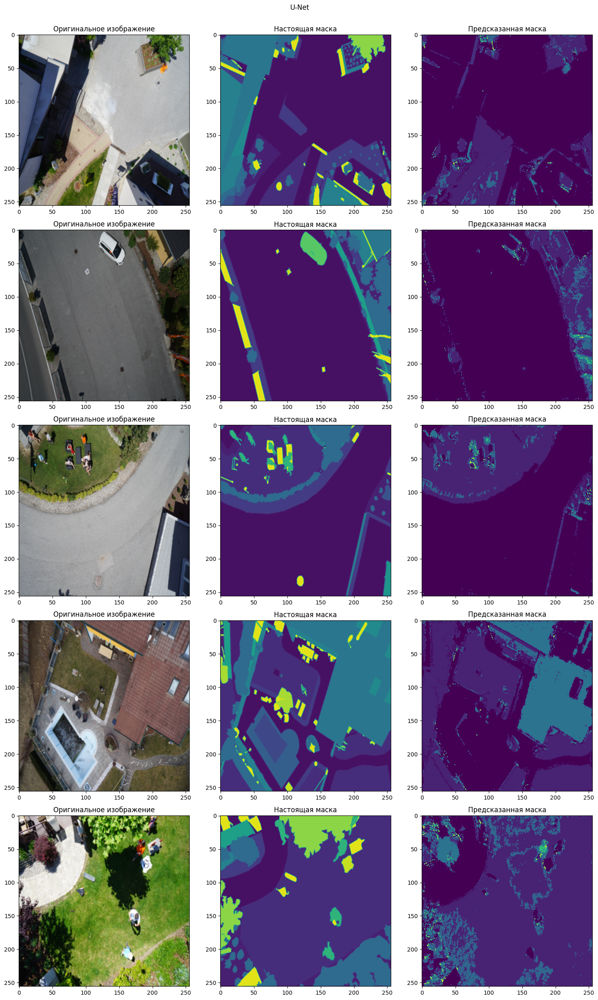

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


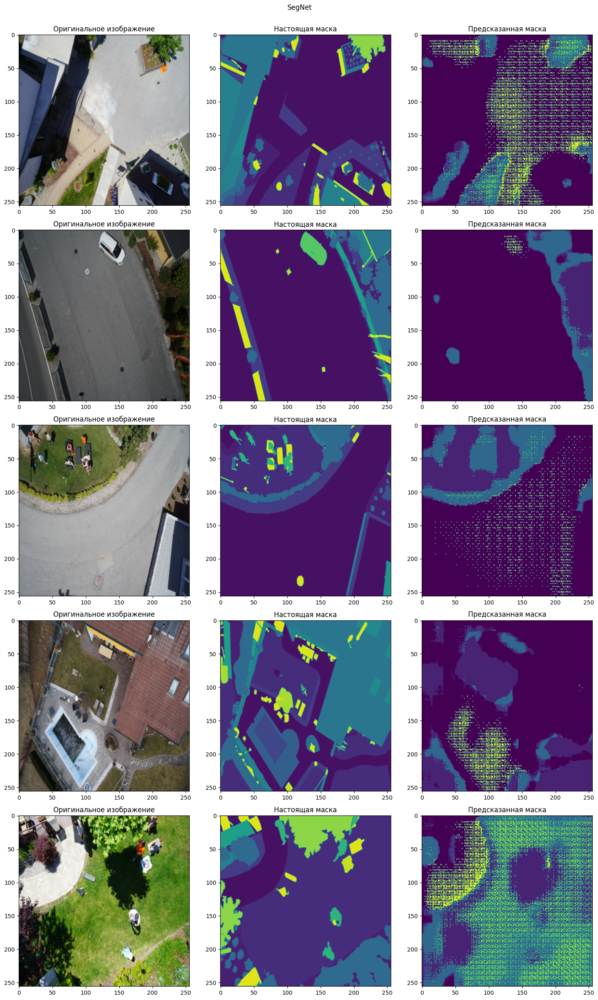

In [ ]:
def display_predictions(models, images, masks, num_examples=5):
    for model_name, model in models:
        predictions = model.predict(images[:num_examples])
        fig, axes = plt.subplots(num_examples, 3, figsize=(15, num_examples * 5))
        fig.suptitle(model_name)

        for i in range(num_examples):
            axes[i, 0].imshow(images[i])
            axes[i, 0].set_title('Оригинальное изображение')
            axes[i, 1].imshow(np.argmax(masks[i], axis=-1))
            axes[i, 1].set_title('Настоящая маска')
            predicted_mask = np.argmax(predictions[i], axis=-1)
            axes[i, 2].imshow(predicted_mask)
            axes[i, 2].set_title('Предсказанная маска')

        plt.tight_layout()
        plt.subplots_adjust(top=0.95)
        plt.show()

models = [('U-Net', model), ('SegNet', segnet)]
display_predictions(models, X_val, y_val_cat)

1. Измените в архитектуре U-Net число фильтров на первом свёрточном блоке, скорректируйте остальные свёрточные блоки, обучите модель повторно и сравните результаты.
2. Измените способ аугментации данных тренировочного набора (или не используйте аугментацию вообще), обучите модель повторно и сравните результаты.
3. Изучите возможность реализации архитектуры U-Net++ https://habr.com/ru/articles/709276/  

In [ ]:
#у сегннет добавть свёрточные, энкодер всегда из 3 словем сонв батч пулинг


In [ ]:
def unet1_model(input_size=(256, 256, 3), num_classes=23):
  inputs = tf.keras.layers.Input(input_size)
  c1 = tf.keras.layers.Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (inputs)
  c1 = tf.keras.layers.Dropout(0.5) (c1)
  c1 = tf.keras.layers.Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
  p1 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)) (c1)

  c2 = tf.keras.layers.Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
  c2 = tf.keras.layers.Dropout(0.5) (c2)
  c2 = tf.keras.layers.Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
  c2 = tf.keras.layers.Dropout(0.5) (c2)
  p2 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)) (c2)

  up1_2 = tf.keras.layers.Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(c2)
  conv1_2 = tf.keras.layers.concatenate([up1_2, c1], name='merge12', axis=3)
  c3 = tf.keras.layers.Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_2)
  c3 = tf.keras.layers.Dropout(0.5) (c3)
  c3 = tf.keras.layers.Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
  c3 = tf.keras.layers.Dropout(0.5) (c3)

  conv3_1 = tf.keras.layers.Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
  conv3_1 = tf.keras.layers.Dropout(0.5) (conv3_1)
  conv3_1 = tf.keras.layers.Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_1)
  conv3_1 = tf.keras.layers.Dropout(0.5) (conv3_1)
  pool3 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

  up2_2 = tf.keras.layers.Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
  conv2_2 = tf.keras.layers.concatenate([up2_2, c2], name='merge22', axis=3) #x10
  conv2_2 = tf.keras.layers.Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_2)
  conv2_2 = tf.keras.layers.Dropout(0.5) (conv2_2)
  conv2_2 = tf.keras.layers.Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_2)
  conv2_2 = tf.keras.layers.Dropout(0.5) (conv2_2)

  up1_3 = tf.keras.layers.Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
  conv1_3 = tf.keras.layers.concatenate([up1_3, c1, c3], name='merge13', axis=3)
  conv1_3 = tf.keras.layers.Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_3)
  conv1_3 = tf.keras.layers.Dropout(0.5) (conv1_3)
  conv1_3 = tf.keras.layers.Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_3)
  conv1_3 = tf.keras.layers.Dropout(0.5) (conv1_3)

  conv4_1 =tf.keras.layers. Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pool3)
  conv4_1 = tf.keras.layers.Dropout(0.5) (conv4_1)
  conv4_1 = tf.keras.layers.Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_1)
  conv4_1 = tf.keras.layers.Dropout(0.5) (conv4_1)
  pool4 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

  up3_2 = tf.keras.layers.Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
  conv3_2 = tf.keras.layers.concatenate([up3_2, conv3_1], name='merge32', axis=3) #x20
  conv3_2 = tf.keras.layers.Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_2)
  conv3_2 = tf.keras.layers.Dropout(0.5) (conv3_2)
  conv3_2 = tf.keras.layers.Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_2)
  conv3_2 = tf.keras.layers.Dropout(0.5) (conv3_2)

  up2_3 = tf.keras.layers.Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
  conv2_3 = tf.keras.layers.concatenate([up2_3, c2, conv2_2], name='merge23', axis=3)
  conv2_3 = tf.keras.layers.Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_3)
  conv2_3 = tf.keras.layers.Dropout(0.5) (conv2_3)
  conv2_3 = tf.keras.layers.Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_3)
  conv2_3 = tf.keras.layers.Dropout(0.5) (conv2_3)

  up1_4 = tf.keras.layers.Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
  conv1_4 = tf.keras.layers.concatenate([up1_4, c1, c3, conv1_3], name='merge14', axis=3)
  conv1_4 = tf.keras.layers.Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_4)
  conv1_4 = tf.keras.layers.Dropout(0.5) (conv1_4)
  conv1_4 = tf.keras.layers.Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_4)
  conv1_4 = tf.keras.layers.Dropout(0.5) (conv1_4)

  conv5_1 = tf.keras.layers.Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pool4)
  conv5_1 = tf.keras.layers.Dropout(0.5) (conv5_1)
  conv5_1 = tf.keras.layers.Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv5_1)
  conv5_1 = tf.keras.layers.Dropout(0.5) (conv5_1)

  up4_2 = tf.keras.layers.Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
  conv4_2 = tf.keras.layers.concatenate([up4_2, conv4_1], name='merge42', axis=3) #x30
  conv4_2 = tf.keras.layers.Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_2)
  conv4_2 = tf.keras.layers.Dropout(0.5) (conv4_2)
  conv4_2 = tf.keras.layers.Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_2)
  conv4_2 = tf.keras.layers.Dropout(0.5) (conv4_2)

  up3_3 = tf.keras.layers.Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
  conv3_3 = tf.keras.layers.concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=3)
  conv3_3 = tf.keras.layers.Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_3)
  conv3_3 = tf.keras.layers.Dropout(0.5) (conv3_3)
  conv3_3 = tf.keras.layers.Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_3)
  conv3_3 = tf.keras.layers.Dropout(0.5) (conv3_3)

  up2_4 = tf.keras.layers.Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
  conv2_4 = tf.keras.layers.concatenate([up2_4, c2, conv2_2, conv2_3], name='merge24', axis=3)
  conv2_4 = tf.keras.layers.Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_4)
  conv2_4 = tf.keras.layers.Dropout(0.5) (conv2_4)
  conv2_4 = tf.keras.layers.Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_4)
  conv2_4 = tf.keras.layers.Dropout(0.5) (conv2_4)

  up1_5 = tf.keras.layers.Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
  conv1_5 = tf.keras.layers.concatenate([up1_5, c1, c3, conv1_3, conv1_4], name='merge15', axis=3)
  conv1_5 = tf.keras.layers.Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_5)
  conv1_5 = tf.keras.layers.Dropout(0.5) (conv1_5)
  conv1_5 = tf.keras.layers.Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_5)
  conv1_5 = tf.keras.layers.Dropout(0.5) (conv1_5)

  outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='sigmoid', kernel_initializer = 'he_normal',  name='output_4', padding='same')(conv1_5)

  model = tf.keras.Model(inputs=inputs, outputs=outputs)
  return model
model = unet1_model(input_size=(256, 256, 3), num_classes=num_classes)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[MeanIoU(num_classes=num_classes)])
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_163 (Conv2D)       │ (None, 256, 256, 32)   │            896 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_112 (Dropout)     │ (None, 256, 256, 32)   │              0 │ conv2d_163[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_164 (Conv2D)       │ (None, 256, 256, 32)   │          9,248 │ dropout_112[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_20          │ (None, 128, 128, 32)   │              0 │ conv2d_164[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_165 (Conv2D)       │ (None, 128, 128, 64)   │         18,496 │ max_pooling2d_20[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_113 (Dropout)     │ (None, 128, 128, 64)   │              0 │ conv2d_165[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_166 (Conv2D)       │ (None, 128, 128, 64)   │         36,928 │ dropout_113[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_114 (Dropout)     │ (None, 128, 128, 64)   │              0 │ conv2d_166[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_21          │ (None, 64, 64, 64)     │              0 │ dropout_114[0][0]      │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_169 (Conv2D)       │ (None, 64, 64, 128)    │         73,856 │ max_pooling2d_21[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_117 (Dropout)     │ (None, 64, 64, 128)    │              0 │ conv2d_169[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_170 (Conv2D)       │ (None, 64, 64, 128)    │        147,584 │ dropout_117[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_118 (Dropout)     │ (None, 64, 64, 128)    │              0 │ conv2d_170[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool3 (MaxPooling2D)      │ (None, 32, 32, 128)    │              0 │ dropout_118[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_175 (Conv2D)       │ (None, 32, 32, 256)    │        295,168 │ pool3[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_123 (Dropout)     │ (None, 32, 32, 256)    │              0 │ conv2d_175[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_176 (Conv2D)       │ (None, 32, 32, 256)    │        590,080 │ dropout_123[0][0]      │
├──────────────────────

 Total params: 9,042,936 (34.50 MB)

 Trainable params: 9,042,936 (34.50 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
unet1_history = model.fit(train_generator,
                    validation_data=(X_val, y_val_cat),
                    steps_per_epoch=len(X_train) // 16,
                    epochs=5)

Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - loss: 1902.4082 - mean_io_u_5: 0.2611 - val_loss: 7.0161 - val_mean_io_u_5: 0.3810
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 53s 3s/step - loss: 9.5174 - mean_io_u_5: 0.3286 - val_loss: 6.5052 - val_mean_io_u_5: 0.3810
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 51s 3s/step - loss: 9.1989 - mean_io_u_5: 0.3284 - val_loss: 5.7179 - val_mean_io_u_5: 0.3810
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 54s 3s/step - loss: 8.5036 - mean_io_u_5: 0.3285 - val_loss: 4.9603 - val_mean_io_u_5: 0.3810
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 53s 3s/step - loss: 7.8917 - mean_io_u_5: 0.3285 - val_loss: 4.3316 - val_mean_io_u_5: 0.3810


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


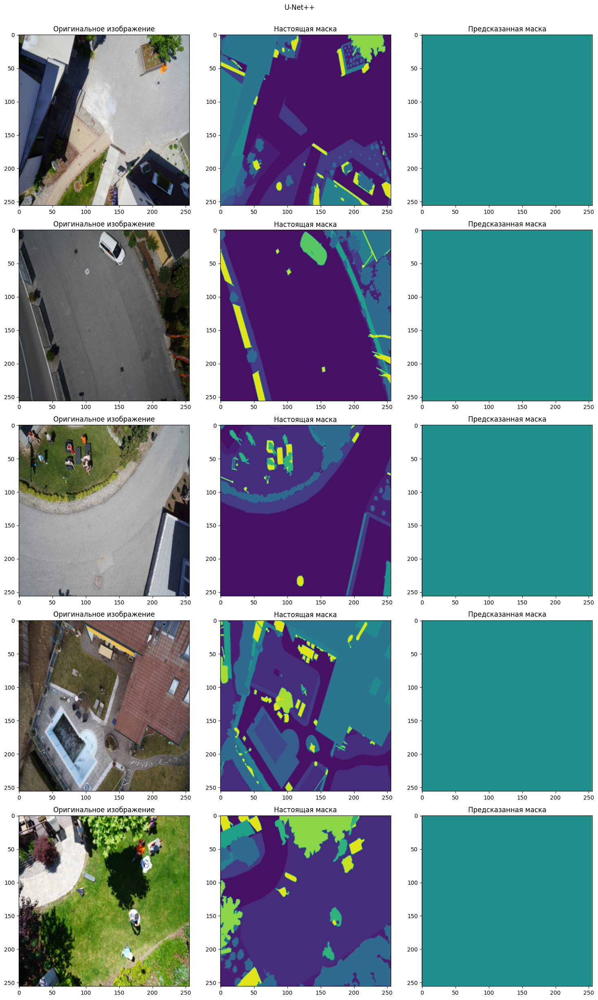

In [ ]:
def display_predictions(models, images, masks, num_examples=5):
    for model_name, model in models:
        predictions = model.predict(images[:num_examples])
        fig, axes = plt.subplots(num_examples, 3, figsize=(15, num_examples * 5))
        fig.suptitle(model_name)

        for i in range(num_examples):
            axes[i, 0].imshow(images[i])
            axes[i, 0].set_title('Оригинальное изображение')
            axes[i, 1].imshow(np.argmax(masks[i], axis=-1))
            axes[i, 1].set_title('Настоящая маска')
            predicted_mask = np.argmax(predictions[i], axis=-1)
            axes[i, 2].imshow(predicted_mask)
            axes[i, 2].set_title('Предсказанная маска')

        plt.tight_layout()
        plt.subplots_adjust(top=0.95)
        plt.show()

models = [('U-Net++', model)]
display_predictions(models, X_val, y_val_cat)